In [ ]:
"""
Setting for google colab
"""
# The path of your project on google drive
path_project = "/content/drive/MyDrive/cartography msc/Thesis TUM 2024/momepy/"

# Connect colab with google drive
from google.colab import drive
drive.mount('/content/drive')

# Set the project path as current working directory
import os
os.chdir(path_project)
print("Current files under the working directory:", os.listdir())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Current files under the working directory: ['case_studies.csv', 'cache', 'case_studies3.csv', 'Brasilia.gpkg', 'results', '01_morphometrics.ipynb', 'case_studies.gsheet', 'Asu.csv', 'Case_of_studies.gsheet', 'slums.csv', 'morphometrics_slums.ipynb', 'examples.ipynb', 'Chacarita_morphometrics.ipynb', 'Africa_Katanga_Morphometrics.ipynb', 'Southametica_Bañado Sur_Morphometrics.ipynb', 'tree.dot', 'joined_data.csv', 'buildings_data.csv', 'Asia_Korail_Morphometrics.ipynb', 'merged_df.csv', 'slums.gsheet']


# Imports

In [ ]:
!pip install momepy
!pip install osmnx
!pip install PyDrive
!pip install clustergram
!pip install folium matplotlib mapclassify
!pip install shapely
!pip install matplotlib-scalebar
!pip install basemap


import pandas as pd
import geopandas as gpd
import networkx as nx
import numpy as np
import momepy as mm
import pyproj
import osmnx as ox
import libpysal
from shapely.geometry import box
from time import time
from clustergram import Clustergram
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib_scalebar.scalebar import ScaleBar
from mpl_toolkits.basemap import Basemap
from bokeh.io import output_notebook
from bokeh.plotting import show
from scipy.spatial.distance import euclidean
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, classification_report
import seaborn as sns

from shapely import LineString
from shapely.geometry import Point

# Usage of osmnx to get the data

In [ ]:
point = (23.784425, 90.408570)
dist = 700
gdf = ox.geometries.geometries_from_point(point, dist=dist, tags={'building':True})
gdf2 = ox.geometries.geometries_from_point(point, dist=dist, tags={'residential':['irregular_settlement']})
gdf_projected = ox.projection.project_gdf(gdf)
gdf_projected_2 = ox.projection.project_gdf(gdf2)
buildings = gdf_projected[gdf_projected.geom_type.isin(['Polygon', 'MultiPolygon'])]
Korail = gdf_projected_2[gdf_projected_2.geom_type.isin(['Polygon', 'MultiPolygon'])]

buildings['uID'] = mm.unique_id(buildings)
Korail['uID'] = mm.unique_id(Korail)
limit = mm.buffered_limit(buildings) # this define limit for momepy.Tessellation as a buffer around buildings.
tessellation = mm.Tessellation(buildings, unique_id='uID', limit=limit).tessellation

# Ensure that Korail is a single polygon (dissolve if there are multiple polygons)
Korail_union = Korail.unary_union

<ipython-input-3-04bb7056b393>:3: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf = ox.geometries.geometries_from_point(point, dist=dist, tags={'building':True})
<ipython-input-3-04bb7056b393>:4: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf2 = ox.geometries.geometries_from_point(point, dist=dist, tags={'residential':['irregular_settlement']})
/usr/local/lib/python3.10/dist-packages/geopan

Inward offset...
Generating input point array...
Generating Voronoi diagram...
Generating GeoDataFrame...
Dissolving Voronoi polygons...


<ipython-input-3-04bb7056b393>:13: UserWarning: Tessellation does not fully match buildings. 11 element(s) collapsed during generation - unique_id: {591, 7631, 8850, 8793, 9376, 8674, 8877, 9198, 9325, 9326, 9202}.
  tessellation = mm.Tessellation(buildings, unique_id='uID', limit=limit).tessellation


In [ ]:
#Number of buildings obtained for training dataset
total_buildings = len(buildings)
print(f"Total number of buildings: {total_buildings}")

Total number of buildings: 10709


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


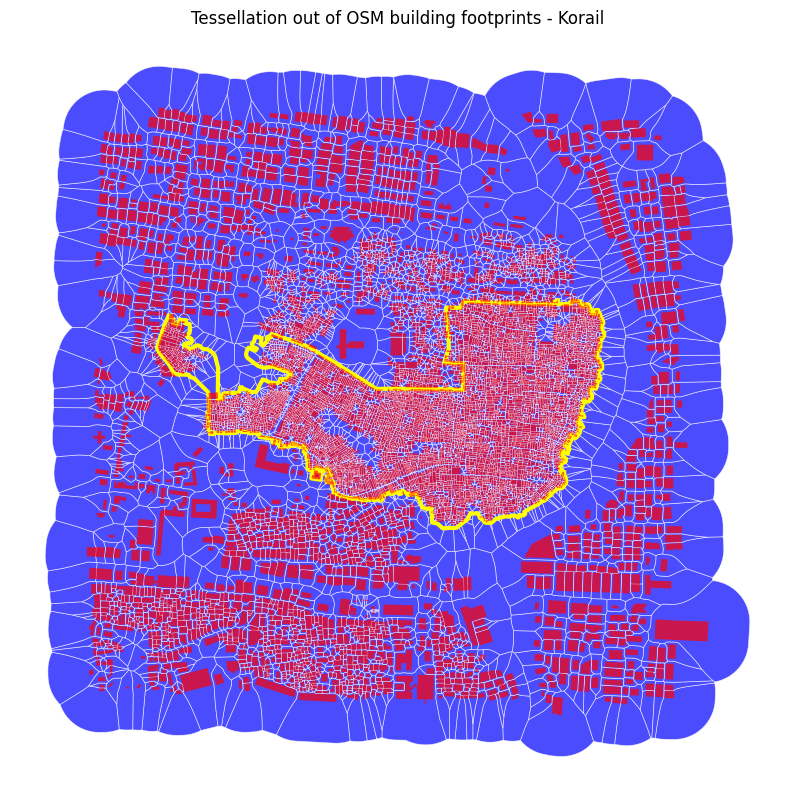

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, edgecolor='white', linewidth=0.5, facecolor='blue', alpha=.7)
Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=3)
buildings.plot(ax=ax, color='red', alpha=.7)
plt.title('Tessellation out of OSM building footprints - Korail')
ax.set_axis_off()
plt.show()

## Areas
Building areas

In [ ]:
blg_area = mm.Area(buildings)
buildings['area'] = blg_area.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-6-0e5a57a77097>:1: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  blg_area = mm.Area(buildings)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

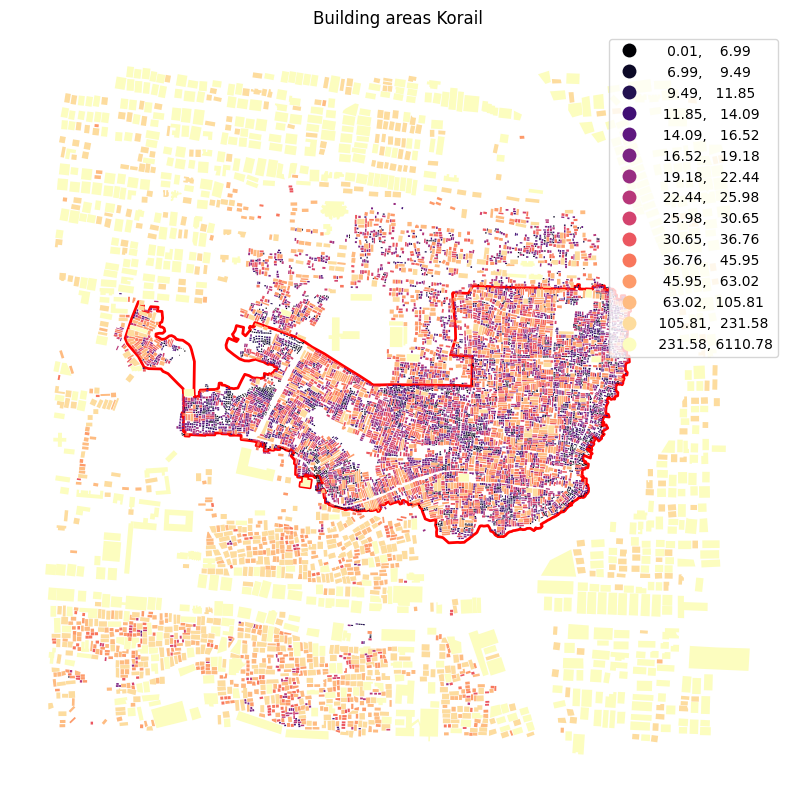

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='area', legend=True, scheme='quantiles', k=15, cmap='magma')
plt.title('Building areas Korail')
ax.set_axis_off()
plt.show()

# Perimeters

In [ ]:
buildings['perimeter'] = mm.Perimeter(buildings).series
buildings.perimeter[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-8-04f7264ccdaa>:1: FutureWarning: `momepy.Perimeter` is deprecated. Replace it with `.length` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  buildings['perimeter'] = mm.Perimeter(buildings).series
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key,

352.73087564296867

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


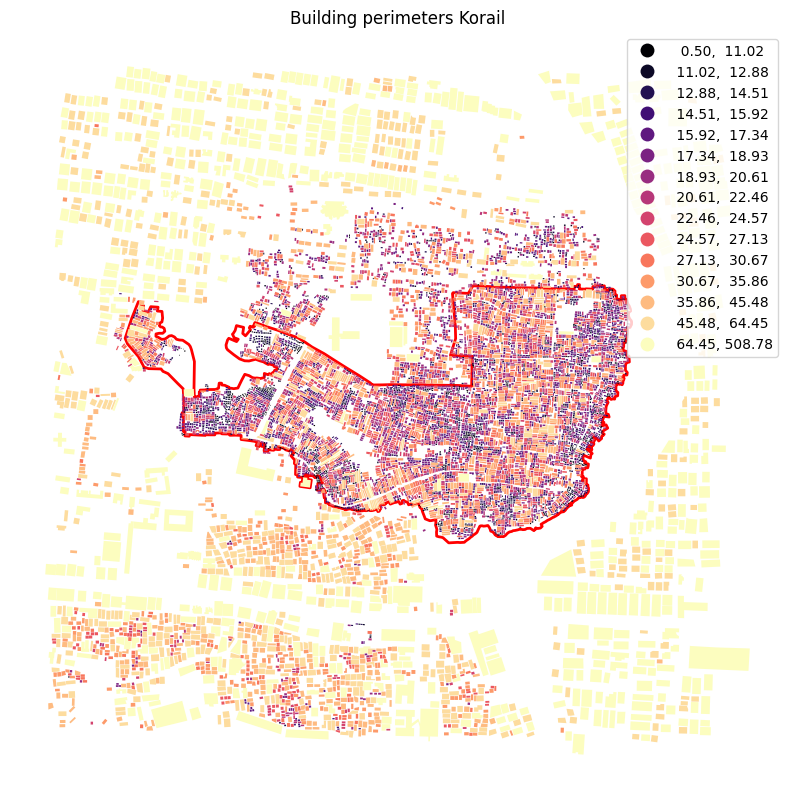

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='perimeter', legend=True, scheme='quantiles', k=15, cmap='magma')
plt.title('Building perimeters Korail')
ax.set_axis_off()
plt.show()

# Longest Axis Length

Calculates the length of the longest axis of object. Axis is defined as a diameter of minimal circumscribed circle around the convex hull

In [ ]:
buildings['lal'] = mm.LongestAxisLength(buildings).series
buildings.lal[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-10-e61e99142893>:1: FutureWarning: Class based API like `momepy.LongestAxisLength` is deprecated. Replace it with `momepy.longest_axis_length` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['lal'] = mm.LongestAxisLength(buildings).series
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

137.57359982368334

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


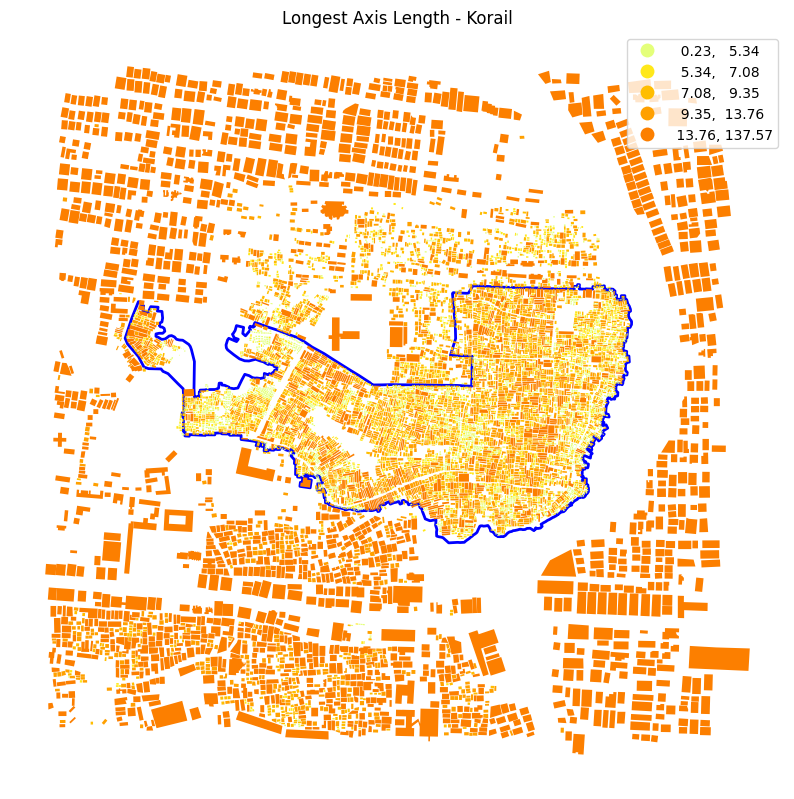

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='lal', legend=True, scheme='quantiles', cmap='Wistia')
plt.title('Longest Axis Length - Korail')
ax.set_axis_off()
plt.show()

## **SPATIAL DISTRIBUTION METRICS**

# Distance to neighbours buidlings

Caculates the distance to neighbours buildings through queen contiguity weights of the first order capturing the relationship between immediate neighbours.Relationship between buildings is here represented by relationships between their tessellation cells.

In [ ]:
sw1 = mm.sw_high(k=1, gdf=tessellation, ids='uID')
buildings['neighbour_dist'] = mm.NeighborDistance(buildings, sw1, 'uID').series
buildings = buildings.dropna(subset=['neighbour_dist'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-12-e5654393bf88>:1: FutureWarning: `momepy.sw_high` is deprecated. Replace it with .higher_order() method of libpysal.graph.Graph or pin momepy version <1.0. This class will be removed in 1.0. 
  sw1 = mm.sw_high(k=1, gdf=tessellation, ids='uID')
<ipython-input-12-e5654393bf88>:2: FutureWarning: Class based API like `momepy.NeighborDistance` is deprecated. Replace it with `momepy.neighbor_distance` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['neighbour_dist'] = mm.NeighborDistance(buildings, sw1, 'uID').series


  0%|          | 0/10709 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


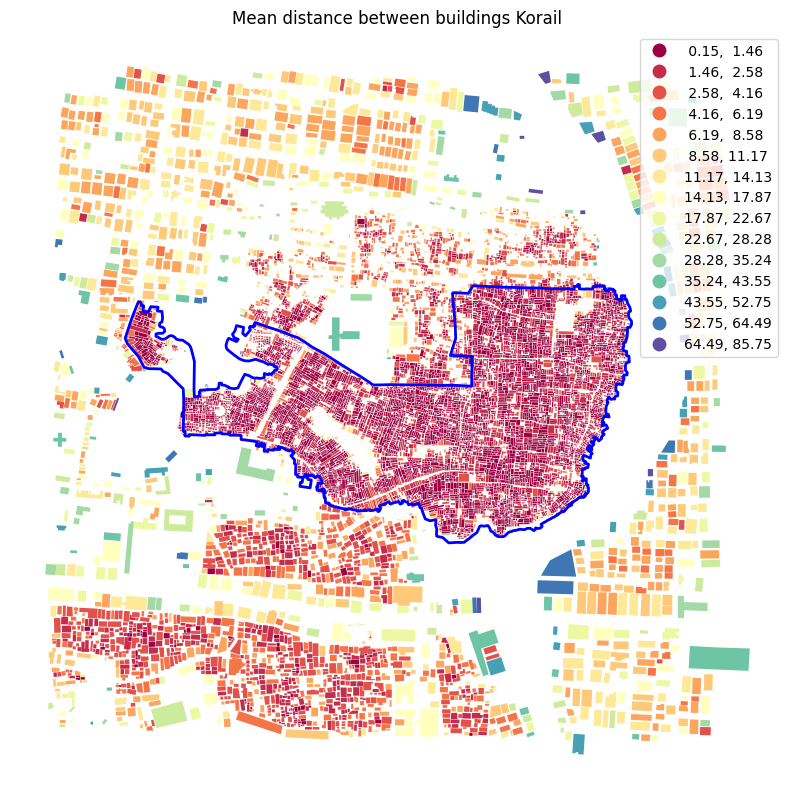

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
buildings.plot(ax=ax, column='neighbour_dist', scheme='naturalbreaks', k=15, legend=True, cmap='Spectral')
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
plt.title('Mean distance between buildings Korail')
ax.set_axis_off()
plt.show()

# Mean Interbuilding Distance

 Interbuilding distances are calculated between buildings on adjacent cells based on spatial_weights,

In [ ]:
MID = mm.MeanInterbuildingDistance(buildings, sw1,'uID')
buildings['mean_interbuilding_distance'] = MID.series


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-14-d2f1a476d11a>:1: FutureWarning: Class based API like `momepy.MeanInterbuildingDistance` is deprecated. Replace it with `momepy.mean_interbuilding_distance` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  MID = mm.MeanInterbuildingDistance(buildings, sw1,'uID')


Computing mean interbuilding distances...


  0%|          | 0/10698 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


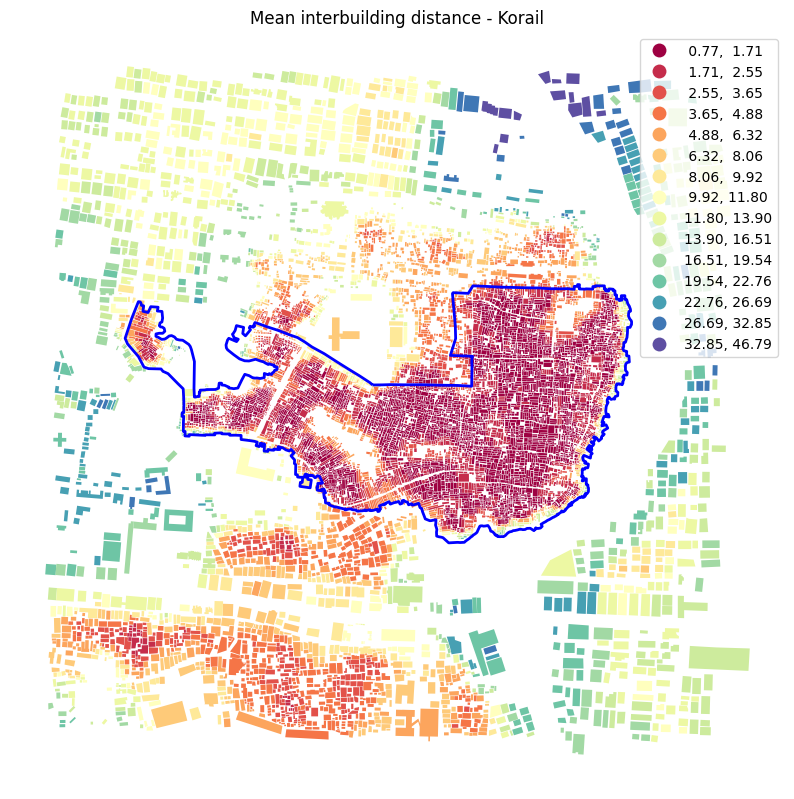

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
buildings.plot(ax=ax, column='mean_interbuilding_distance', scheme='naturalbreaks', k=15, legend=True, cmap='Spectral')
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
plt.title('Mean interbuilding distance - Korail')
ax.set_axis_off()
plt.show()

In [ ]:
print(buildings.columns)

Index(['addr:city', 'addr:housenumber', 'addr:postcode', 'addr:street',
       'building', 'name', 'note', 'office', 'website', 'geometry',
       'building:levels', 'smoking', 'phone', 'addr:country', 'addr:house',
       'addr:suburb', 'addr:word', 'amenity', 'building:material', 'name:bn',
       'name:en', 'place_of_worship', 'religion', 'addr:neighbourhood',
       'addr:housename', 'material', 'nodes', 'shop', 'wikidata', 'wikipedia',
       'wheelchair', 'tourism', 'description', 'brand', 'internet_access',
       'internet_access:fee', 'layer', 'email', 'capacity', 'cuisine',
       'takeaway', 'lift', 'structure', 'ruins', 'source', 'name:fr',
       'denomination', 'level', 'opening_hours', 'healthcare', 'addr:place',
       'addr:district', 'club', 'operator', 'sport', 'Type', 'delivery',
       'outdoor_seating', 'stars', 'building:condition', 'contact:facebook',
       'payment:american_express', 'payment:app', 'payment:cards',
       'payment:cash', 'payment:debit_cards',

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## **SHAPE METRICS**

# Circular compactness

measures the ratio of object area to the area of its smallest circumsribed circle.
This ratio indicates how efficiently the object's area fills the smallest circumscribed circle.
Values closer to 1 indicating a shape more similar to a perfect circle.

In [ ]:
blg_cc = mm.CircularCompactness(buildings)
buildings['circular_com'] = blg_cc.series

<ipython-input-17-8b89b561cc24>:1: FutureWarning: Class based API like `momepy.CircularCompactness` is deprecated. Replace it with `momepy.circular_compactness` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  blg_cc = mm.CircularCompactness(buildings)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


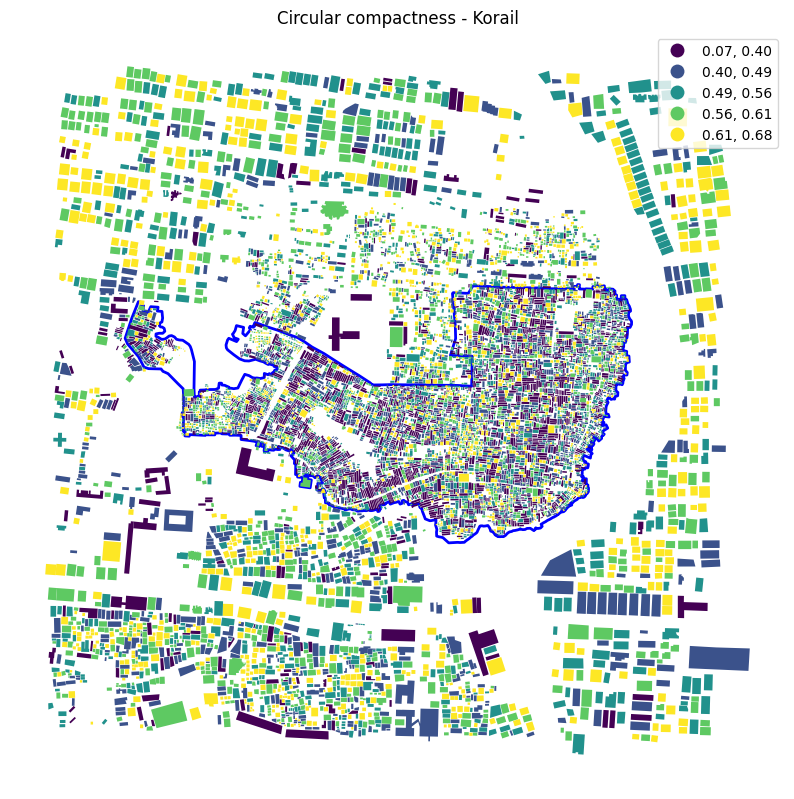

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='circular_com', scheme='quantiles', legend=True, cmap='viridis')
plt.title('Circular compactness - Korail')
ax.set_axis_off()
plt.show()

# Elongation

Elongation of its minimum bounding rectangle.
If the elongation is close to 1, the object is more or less square-shaped indicating little to no elongation.
If it is much greater than 1, the object is significantly elongated in one direction.

In [ ]:
blg_elongation = mm.Elongation(buildings)
buildings['elongation'] = blg_elongation.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-19-c0dd7d404bde>:1: FutureWarning: Class based API like `momepy.Elongation` is deprecated. Replace it with `momepy.elongation` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  blg_elongation = mm.Elongation(buildings)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


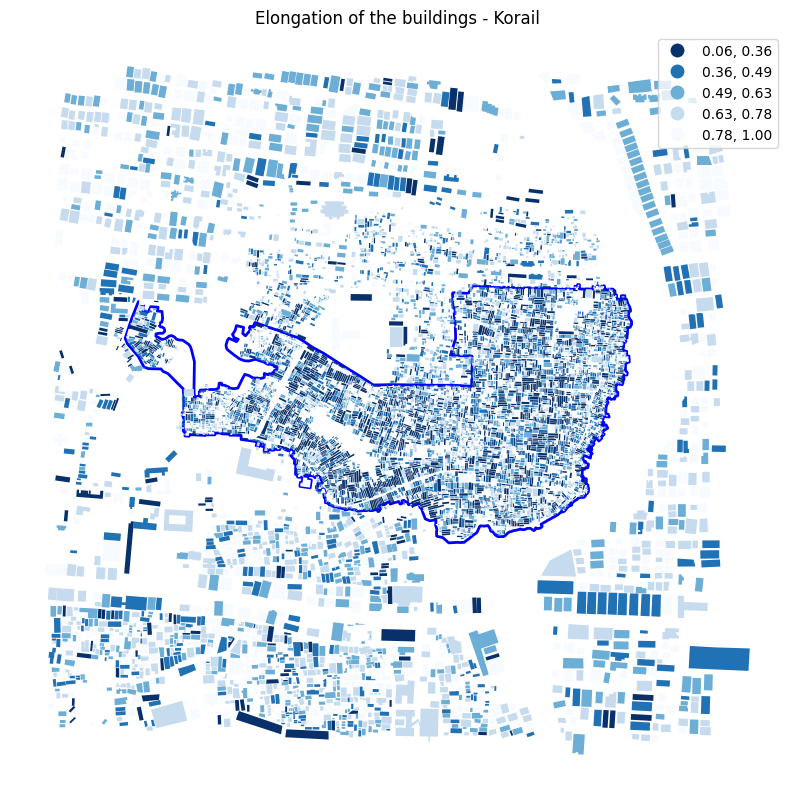

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='elongation', scheme='quantiles', legend=True, cmap='Blues_r')
plt.title('Elongation of the buildings - Korail')
ax.set_axis_off()
plt.show()

# Cell shapes

Calculates the compactness-weighted axis of each tessellation


In [ ]:
tes_cwa = mm.CompactnessWeightedAxis(tessellation)
tessellation['cwa'] = tes_cwa.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-21-66348a3ed6cd>:1: FutureWarning: Class based API like `momepy.CompactnessWeightedAxis` is deprecated. Replace it with `momepy.compactness_weighted_axis` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tes_cwa = mm.CompactnessWeightedAxis(tessellation)
/usr/local/lib/python3.10/dist-packages/momepy/shape.py:1345: FutureWarning: Class based API like `momepy.LongestAxisLength` is deprecated. Replace it with `momepy.longest_axis_length` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  gdf["mm_la"] = LongestAxisLength(gdf)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


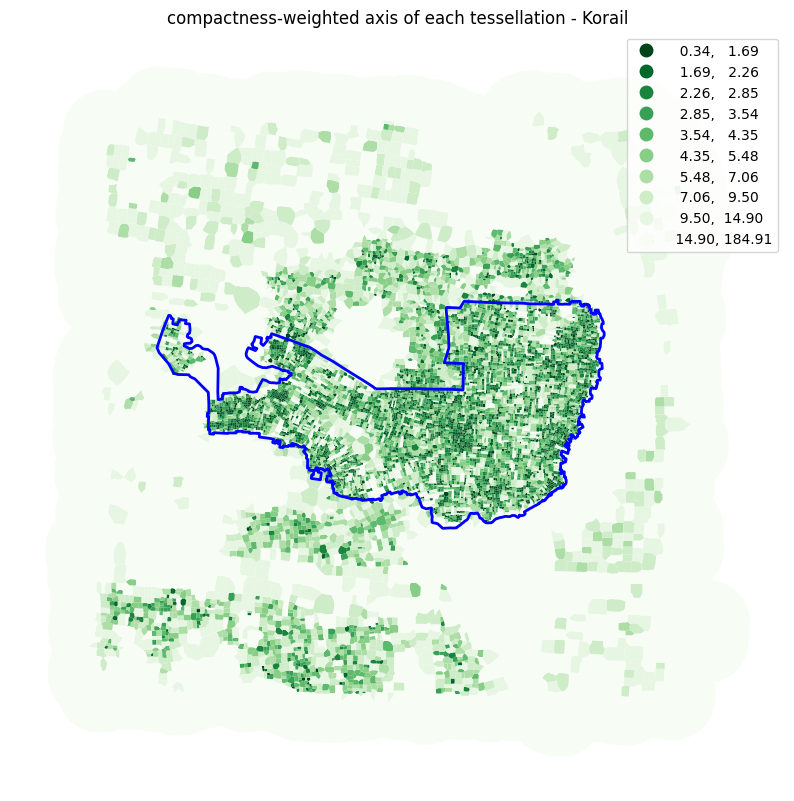

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

tessellation.plot(ax=ax, column='cwa', legend=True, scheme='quantiles', k=10, cmap='Greens_r')
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
plt.title('compactness-weighted axis of each tessellation - Korail')
ax.set_axis_off()
plt.show()

## Covered Area Ratio

In [ ]:
tessellation['area'] = mm.Area(tessellation).series
buildings['area'] = mm.Area(buildings).series
tess_car = mm.AreaRatio(tessellation, buildings, 'area', 'area', 'uID')
tessellation['CAR'] = tess_car.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-23-b17033dd914d>:1: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  tessellation['area'] = mm.Area(tessellation).series
<ipython-input-23-b17033dd914d>:2: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  buildings['area'] = mm.Area(buildings).series
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [ ]:
tess_car = mm.AreaRatio(tessellation, buildings,
                            mm.Area(tessellation).series,
                            mm.Area(buildings).series, 'uID')
tessellation['CAR'] = tess_car.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-24-2fcb44c4cc41>:2: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  mm.Area(tessellation).series,
<ipython-input-24-2fcb44c4cc41>:3: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  mm.Area(buildings).series, 'uID')
<ipython-input-24-2fcb44c4cc41>:1: FutureWarning: `momepy.AreaRatio` is deprecated. Replace it with a direct division of areas or momepy.describe_agg() or pin momepy version <1.0. This cl

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


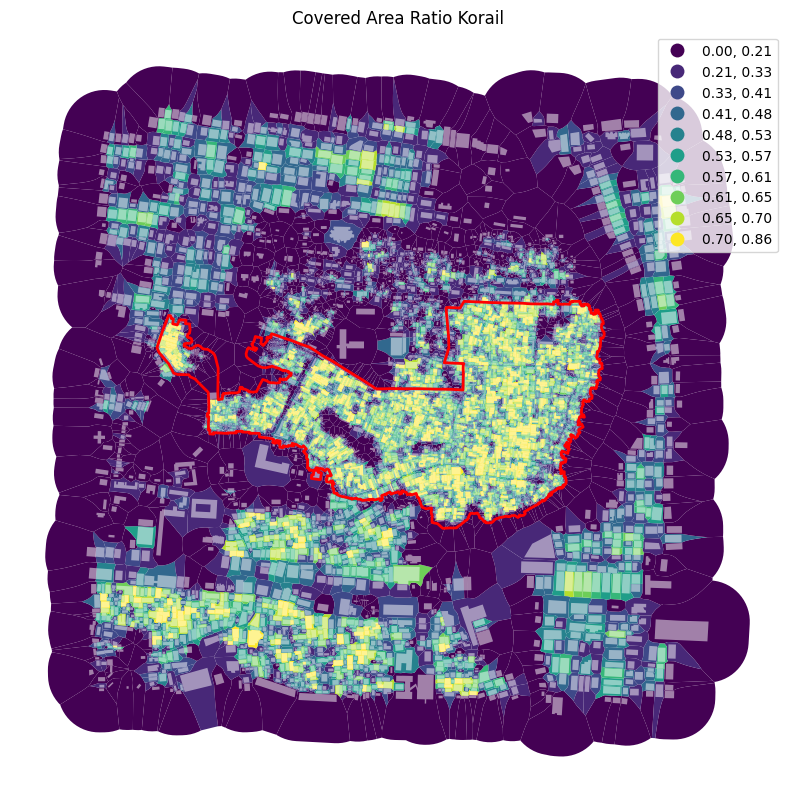

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, column='CAR', legend=True, scheme='quantiles', k=10, cmap='viridis')
plt.title('Covered Area Ratio Korail')
buildings.plot(ax=ax, color='white', alpha=0.5)
Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)
ax.set_axis_off()
plt.show()

# Tesselation Area

In [ ]:
tes_area = mm.Area(tessellation)
tessellation['tes_area'] = tes_area.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-26-76891545b88b>:1: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  tes_area = mm.Area(tessellation)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


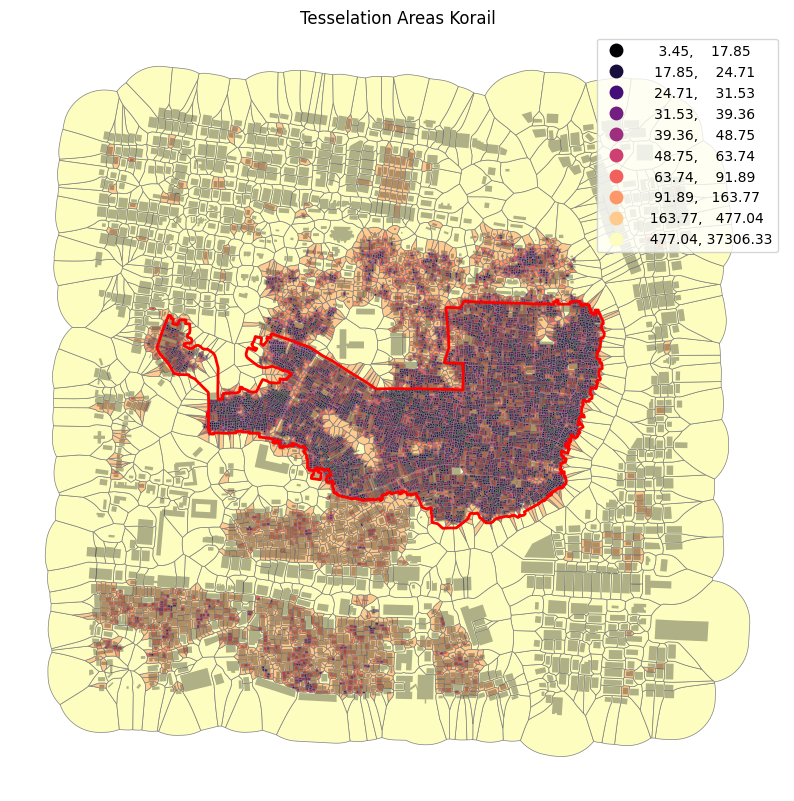

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

tessellation.plot(ax=ax, edgecolor='grey', linewidth=0.5, column='tes_area', legend=True, scheme='quantiles', k=10, cmap='magma', alpha=1)
buildings.plot(ax=ax, color='black', alpha=.3)
Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2)
plt.title('Tesselation Areas Korail')

ax.set_axis_off()
plt.show()

In [ ]:
print(tessellation.head())

         uID                                           geometry        cwa  \
134      134  POLYGON ((236254.382 2631984.021, 236254.652 2...  37.682791   
697      698  POLYGON ((236352.992 2632081.597, 236353.542 2...  32.969564   
120      120  POLYGON ((236340.219 2632126.925, 236340.241 2...  21.506144   
10178  10189  POLYGON ((236368.711 2632129.824, 236368.559 2...  13.720441   
718      719  POLYGON ((236360.000 2632169.682, 236359.500 2...  17.711571   

               area       CAR      tes_area  
134    18052.371237  0.055739  18052.371237  
697     1445.738915  0.387970   1445.738915  
120     1333.567369  0.601259   1333.567369  
10178    956.003740  0.383726    956.003740  
718     1365.745887  0.466501   1365.745887  


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

# Fractal dimension

A fractal dimension greater than 1 for a 2-dimensional patch indicates a departure
from euclidean geometry (that is, an increase in shape complexity).

In [ ]:
buildings['fractal'] = mm.FractalDimension(buildings,'area', 'perimeter').series
buildings.fractal[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-29-c2e6bfadba41>:1: FutureWarning: Class based API like `momepy.FractalDimension` is deprecated. Replace it with `momepy.fractal_dimension` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['fractal'] = mm.FractalDimension(buildings,'area', 'perimeter').series
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

1.027646024125731

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


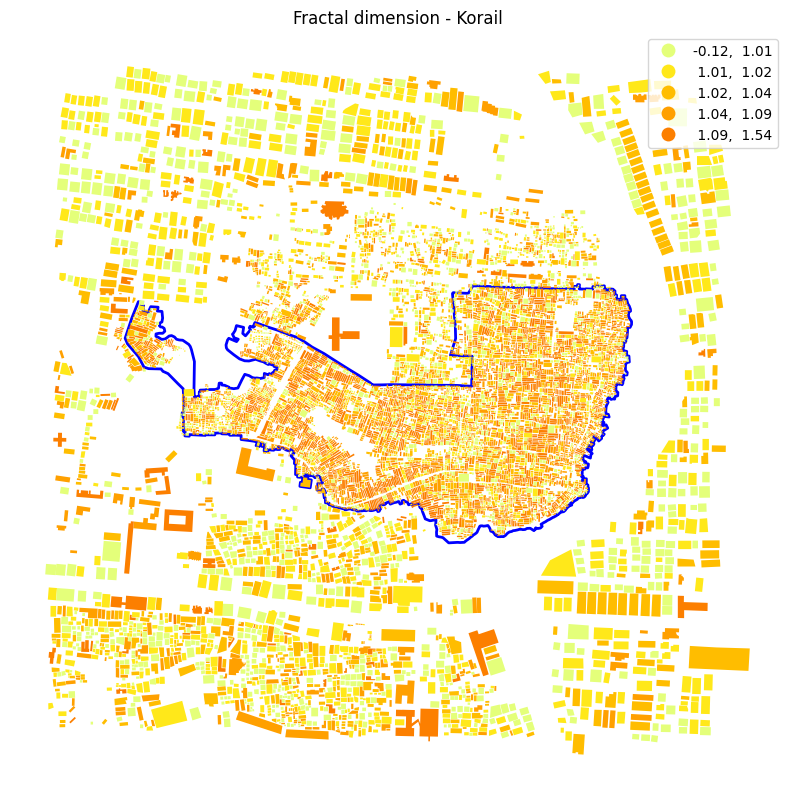

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
buildings.plot(ax=ax, column='fractal', legend=True, scheme='quantiles', cmap='Wistia')
plt.title('Fractal dimension - Korail')
ax.set_axis_off()
plt.show()

# TOPOLOGY METRICS

# Obtain basic dataset = Centroids of the buildings

In [ ]:

# Centroids of the buildings
def multipolygon_centroid(geom):
    if geom.geom_type == 'MultiPolygon':
        return geom.convex_hull.centroid
    else:
        return geom.centroid

buildings['centroid'] = buildings.geometry.apply(multipolygon_centroid)

# Create a GeoDataFrame for the centroids with uID
centroids_gdf = gpd.GeoDataFrame({
    'uID': buildings['uID'],
    'geometry': buildings['centroid']
}, crs=buildings.crs)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
print(buildings.columns)

Index(['addr:city', 'addr:housenumber', 'addr:postcode', 'addr:street',
       'building', 'name', 'note', 'office', 'website', 'geometry',
       'building:levels', 'smoking', 'phone', 'addr:country', 'addr:house',
       'addr:suburb', 'addr:word', 'amenity', 'building:material', 'name:bn',
       'name:en', 'place_of_worship', 'religion', 'addr:neighbourhood',
       'addr:housename', 'material', 'nodes', 'shop', 'wikidata', 'wikipedia',
       'wheelchair', 'tourism', 'description', 'brand', 'internet_access',
       'internet_access:fee', 'layer', 'email', 'capacity', 'cuisine',
       'takeaway', 'lift', 'structure', 'ruins', 'source', 'name:fr',
       'denomination', 'level', 'opening_hours', 'healthcare', 'addr:place',
       'addr:district', 'club', 'operator', 'sport', 'Type', 'delivery',
       'outdoor_seating', 'stars', 'building:condition', 'contact:facebook',
       'payment:american_express', 'payment:app', 'payment:cards',
       'payment:cash', 'payment:debit_cards',

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


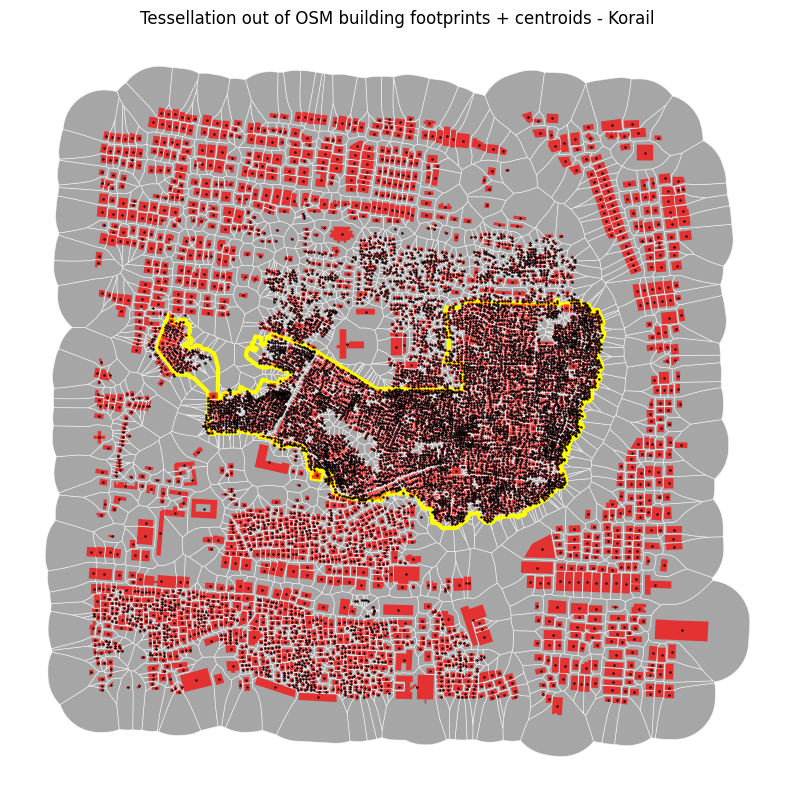

In [ ]:
# Plot
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, edgecolor='white', linewidth=0.5, facecolor='grey', alpha=.7)
Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=3)
buildings.plot(ax=ax, color='red', alpha=.7)
centroids_gdf.plot(ax=ax, color='black', markersize=0.5, marker='o', label='Centroids')
plt.title('Tessellation out of OSM building footprints + centroids - Korail')
ax.set_axis_off()
plt.show()

In [ ]:
total_nodes = len(centroids_gdf)
print(f"Total number of nodes: {total_nodes}")
total_buildings = len(buildings)
print(f"Total number of buildings: {total_buildings}")

Total number of nodes: 10698
Total number of buildings: 10698


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Delaunay Triangulation

In [ ]:
#Coordinates based on the centroids of the buildings
coordinates = np.column_stack((centroids_gdf.geometry.x, centroids_gdf.geometry.y))

from scipy.spatial import Delaunay
tri = Delaunay(coordinates)

# Create a networkx graph out of the Delaunay triangulation
G = nx.Graph()

# Add edges to the graph
for simplex in tri.simplices:
    for i in range(3):
        for j in range(i + 1, 3):
            G.add_edge(simplex[i], simplex[j])

# Get positions of the nodes for plotting
positions = {i: (coordinates[i, 0], coordinates[i, 1]) for i in range(len(coordinates))}

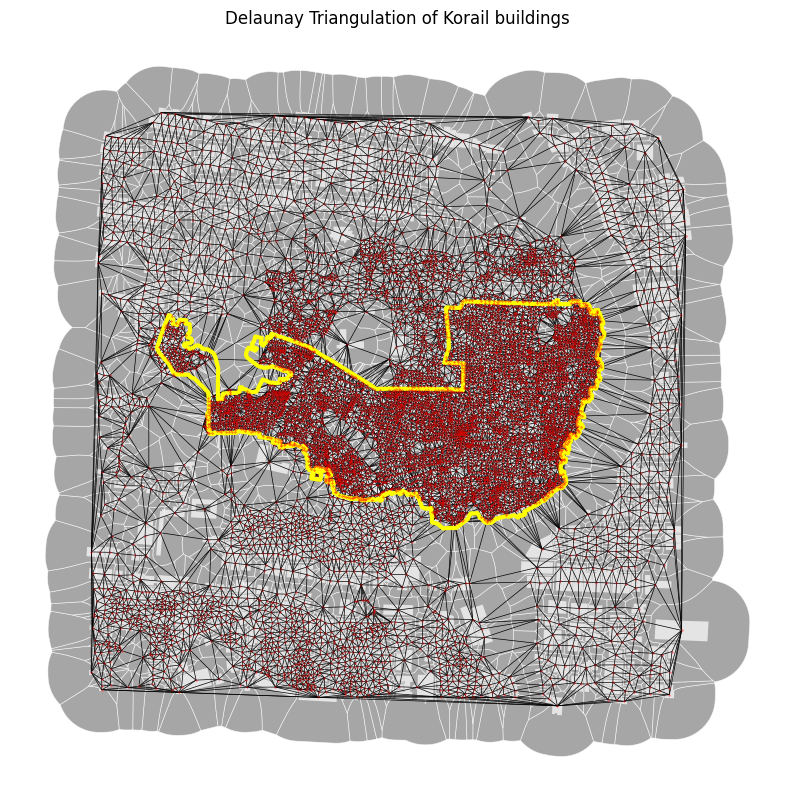

In [ ]:
# Plot
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, edgecolor='white', linewidth=0.5, facecolor='grey', alpha=.7)
buildings.plot(ax=ax, color='white', alpha=.7)

# Edges of the Delaunay triangulation
nx.draw(G, pos=positions, node_size=0.1, node_color='red', edge_color='black', width=0.5)
Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=3)
plt.title('Delaunay Triangulation of Korail buildings')
plt.show()

# Weighted distance

In [ ]:
# Edges to the graph with weights based on Euclidean distance
for simplex in tri.simplices:
    for i in range(3):
        for j in range(i + 1, 3):
            p1 = coordinates[simplex[i]]
            p2 = coordinates[simplex[j]]
            distance = euclidean(p1, p2) #scipy
            G.add_edge(simplex[i], simplex[j], weight=distance) #networkx

# Extract edges with their weights
edges = []
for u, v, data in G.edges(data=True):
    line = LineString([coordinates[u], coordinates[v]])
    edges.append({'geometry': line, 'weight': data['weight']})

# Geodataframe of edges
gdf_edges = gpd.GeoDataFrame(edges)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


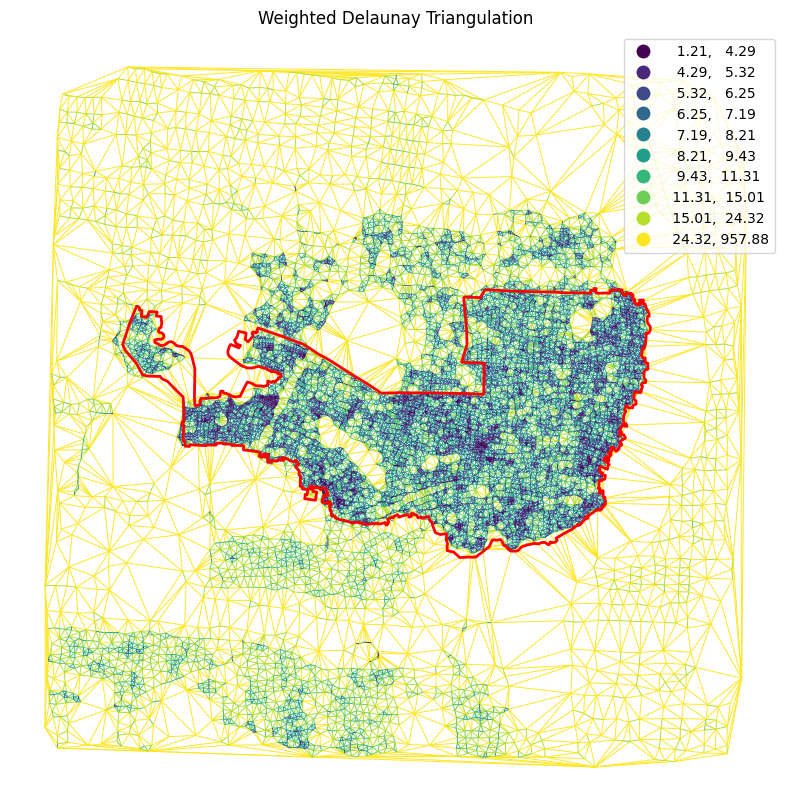

In [ ]:
#Plot
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2, zorder=10)

# centroids_gdf.plot(ax=ax, color='grey', markersize=0.5, marker='o', label='Centroids', zorder=5)

gdf_edges.plot(ax=ax, column='weight', legend=True, scheme='quantiles', k=10, cmap='viridis', linewidth=0.7, zorder=0)

plt.title('Weighted Delaunay Triangulation')
ax.set_axis_off()
plt.show()

In [ ]:
# Initialize a dictionary to store average weighted distances for each node
node_avg_weighted_distance = {}

# Loop through each node in the graph
for node in G.nodes():
    # Get all neighboring nodes (adjacent nodes)
    neighbors = list(G.neighbors(node))

    # Calculate average weighted distance
    total_weighted_distance = 0.0
    count = 0

    # Iterate over edges connecting the node to its neighbors
    for neighbor in neighbors:
        # Get the weight of the edge between node and neighbor
        weight = G[node][neighbor]['weight']

        # Accumulate weighted distance
        total_weighted_distance += weight
        count += 1

    # Calculate average weighted distance for the node
    if count > 0:
        avg_weighted_distance = total_weighted_distance / count
    else:
        avg_weighted_distance = 0.0

    # Store the average weighted distance in the dictionary
    node_avg_weighted_distance[node] = avg_weighted_distance

# Print or use node_avg_weighted_distance as needed
print(node_avg_weighted_distance)

{356: 24.217564549267657, 9887: 67.88384768364965, 396: 33.13780978676762, 308: 37.26423467642473, 305: 62.67115614409008, 1303: 202.66558700714626, 9731: 87.01439952445362, 9730: 46.13608370128499, 9747: 63.85428578587772, 9746: 23.974852151701334, 604: 29.118596616686794, 783: 152.50376580317237, 10371: 111.10251825274922, 1192: 143.15696650497603, 557: 172.3550993824794, 996: 140.1654816161992, 1165: 102.8420221816215, 9852: 86.60177226874389, 10: 240.34713008075343, 1097: 69.10565120152044, 1197: 79.62208719160509, 145: 42.16658055412134, 144: 35.12395249024129, 522: 200.7113118952739, 526: 186.7224530008543, 0: 220.91263926464416, 9733: 123.52461519048484, 459: 71.89063104210695, 1186: 29.729858491046475, 9889: 30.119706482198414, 411: 22.75858563054228, 422: 29.37552739549588, 9885: 29.973418104539387, 1019: 34.528786321588534, 1004: 80.72240220145235, 998: 89.40155508077876, 1006: 34.466520739925436, 537: 68.7158140355982, 997: 39.15554736283214, 538: 58.87011915325132, 1128: 46

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


   avg_weighted_distance
0             220.912639
1              41.047750
2              72.471329
3              36.244606
4              38.779486


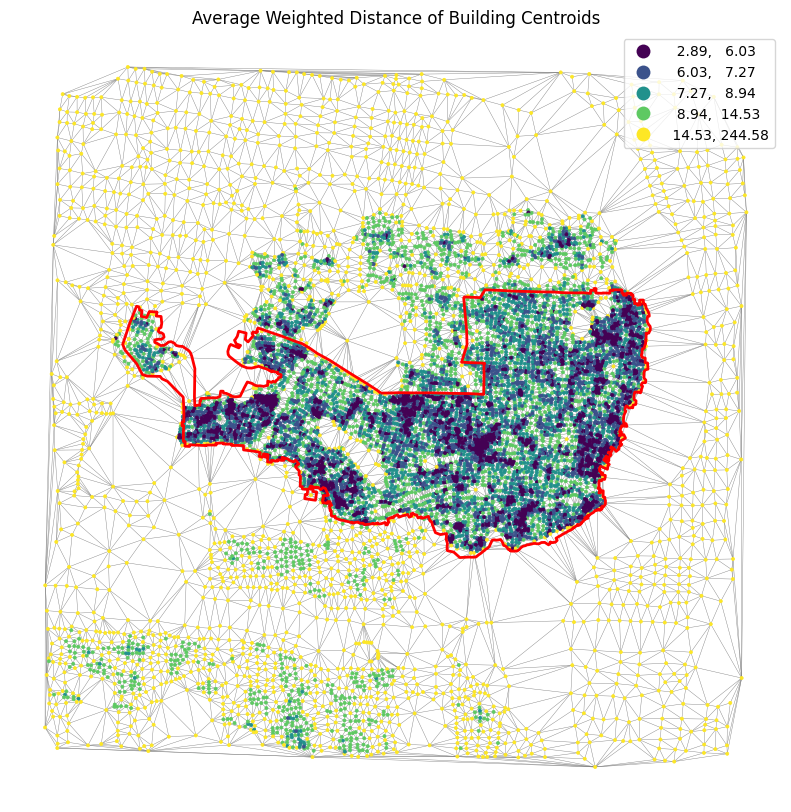

In [ ]:
# Ensure that the GeoDataFrame indices match the graph nodes
centroids_gdf = centroids_gdf.reset_index(drop=True)

# Ensure centroids_gdf has uID as index
# centroids_gdf.set_index('uID', inplace=True)

# Map the average weighted distances to the GeoDataFrame
centroids_gdf['avg_weighted_distance'] = centroids_gdf.index.map(node_avg_weighted_distance)

# Verify the mapping
print(centroids_gdf[['avg_weighted_distance']].head())

# Plot to visualize the average weighted distances
f, ax = plt.subplots(figsize=(10, 10))

# Ensure avg_weighted_distance column exists and is not empty
if 'avg_weighted_distance' in centroids_gdf.columns and not centroids_gdf['avg_weighted_distance'].isnull().all():
    Korail.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2, zorder=10)
    centroids_gdf.plot(ax=ax, column='avg_weighted_distance',  legend=True, scheme='quantiles', cmap='viridis', markersize=5, linewidth=0.5, zorder=5)
    gdf_edges.plot(ax=ax, color='grey', linewidth=0.3, zorder=0)
    plt.title('Average Weighted Distance of Building Centroids')
    ax.set_axis_off()
    plt.show()
else:
    print("Average weighted distance data is missing or empty.")

In [ ]:
total_nodes = len(centroids_gdf)
print(f"Total number of nodes: {total_nodes}")
#same amount of nodes to buildings :)

Total number of nodes: 10698


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print(buildings.columns)

Index(['addr:city', 'addr:housenumber', 'addr:postcode', 'addr:street',
       'building', 'name', 'note', 'office', 'website', 'geometry',
       'building:levels', 'smoking', 'phone', 'addr:country', 'addr:house',
       'addr:suburb', 'addr:word', 'amenity', 'building:material', 'name:bn',
       'name:en', 'place_of_worship', 'religion', 'addr:neighbourhood',
       'addr:housename', 'material', 'nodes', 'shop', 'wikidata', 'wikipedia',
       'wheelchair', 'tourism', 'description', 'brand', 'internet_access',
       'internet_access:fee', 'layer', 'email', 'capacity', 'cuisine',
       'takeaway', 'lift', 'structure', 'ruins', 'source', 'name:fr',
       'denomination', 'level', 'opening_hours', 'healthcare', 'addr:place',
       'addr:district', 'club', 'operator', 'sport', 'Type', 'delivery',
       'outdoor_seating', 'stars', 'building:condition', 'contact:facebook',
       'payment:american_express', 'payment:app', 'payment:cards',
       'payment:cash', 'payment:debit_cards',

# Spatial Joint MM and TP

In [ ]:
# Spatial join using geopandas.sjoin
# Merge buildings and centroids_gdf, ensuring we retain the geometry column
joined_gdf = gpd.GeoDataFrame(
    buildings.merge(centroids_gdf, on='uID', how='left', suffixes=('_building', '_centroid')),
    geometry='geometry_building',
    crs=buildings.crs
)

# Merge the result with the tessellation DataFrame
joined_gdf = joined_gdf.merge(tessellation, on='uID', how='left', suffixes=('', '_tessellation'))

# Check the first few rows to verify the join
print(joined_gdf.head())
print(joined_gdf.geom_type)


  addr:city         addr:housenumber addr:postcode  \
0     Dhaka                      NaN          1212   
1     Dhaka                       75           NaN   
2       NaN                      NaN           NaN   
3     Dhaka  17 (Red Crescent Tower)          1212   
4     Dhaka             66 Mohakhali          1212   

                      addr:street    building                            name  \
0  Bir Uttam A. K. Khandakar Road         yes            গুলশান ১ ডিএনসিসি মল   
1                       Mohakhali  commercial                     BRAC Center   
2                             NaN         yes                             NaN   
3  Bir Uttam A. K. Khandakar Road         yes                    bdnews24.com   
4  Bir Uttam A. K. Khandakar Road  university  BRAC University Building No. 2   

  note     office website                                  geometry_building  \
0  NaN        NaN     NaN  POLYGON ((236605.680 2632253.225, 236574.545 2...   
1  NaN        NaN     NaN  P

# GROUND TRUTH DATA

Objective =  classification of OSM building data into slum / non slum buildings using the Korail neighbourhood polygon as a filter

In [ ]:
# Classify buildings as 'slum' if they are within the Korail polygon, else 'non-slum'
buildings['label'] = np.where(buildings.within(Korail_union), 'slum', 'non-slum')

print("Buildings with labels:")
print(buildings.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Buildings with labels:
                       addr:city         addr:housenumber addr:postcode  \
element_type osmid                                                        
way          24818506      Dhaka                      NaN          1212   
             229029081     Dhaka                       75           NaN   
             232880646       NaN                      NaN           NaN   
             262026526     Dhaka  17 (Red Crescent Tower)          1212   
             272930517     Dhaka             66 Mohakhali          1212   

                                           addr:street    building  \
element_type osmid                                                   
way          24818506   Bir Uttam A. K. Khandakar Road         yes   
             229029081                       Mohakhali  commercial   
             232880646                             NaN         yes   
             262026526  Bir Uttam A. K. Khandakar Road         yes   
             272930517  Bir Utt

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
ground_truth_gdf = buildings.copy()
ground_truth_gdf['label'] = np.where(buildings.within(Korail_union), 'slum', 'non-slum')

print("Buildings with labels:")
print(ground_truth_gdf.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Buildings with labels:
                       addr:city         addr:housenumber addr:postcode  \
element_type osmid                                                        
way          24818506      Dhaka                      NaN          1212   
             229029081     Dhaka                       75           NaN   
             232880646       NaN                      NaN           NaN   
             262026526     Dhaka  17 (Red Crescent Tower)          1212   
             272930517     Dhaka             66 Mohakhali          1212   

                                           addr:street    building  \
element_type osmid                                                   
way          24818506   Bir Uttam A. K. Khandakar Road         yes   
             229029081                       Mohakhali  commercial   
             232880646                             NaN         yes   
             262026526  Bir Uttam A. K. Khandakar Road         yes   
             272930517  Bir Utt

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


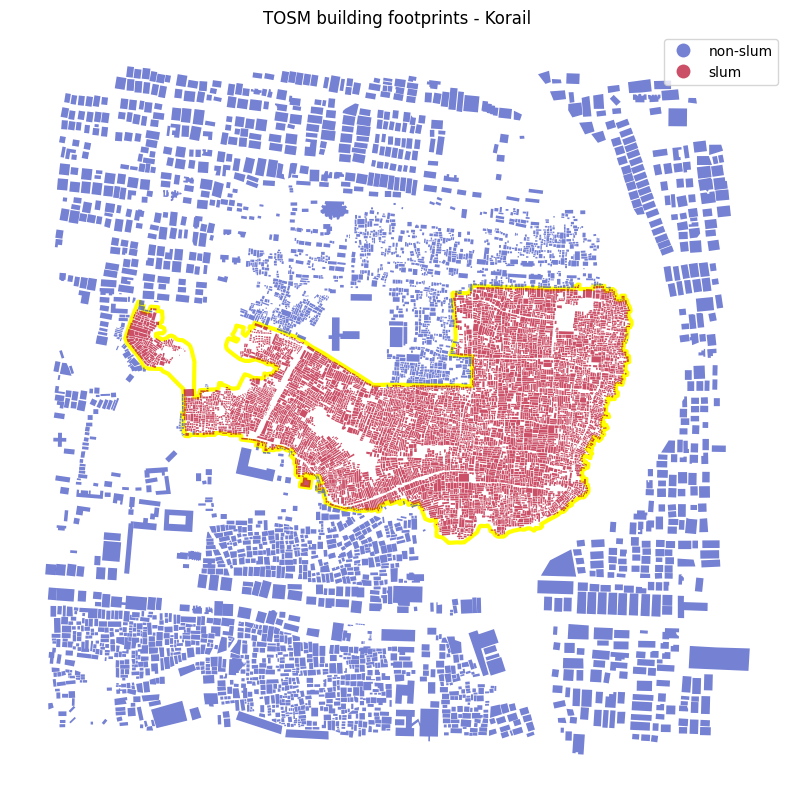

In [ ]:
# Plotting the data
f, ax = plt.subplots(figsize=(10, 10))
Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=3)
ground_truth_gdf.plot(ax=ax, column='label', cmap='coolwarm', alpha=.7, legend=True)
plt.title('TOSM building footprints - Korail')
ax.set_axis_off()
plt.show()

# Classification based on metrics with a stepwise searching between defined ranges

In [ ]:
#area buildings MIN MAX VALUES
min_value_area = joined_gdf['area'].min()
max_value_area = joined_gdf['area'].max()

print("Minimum value:", min_value_area)
print("Maximum value:", max_value_area)

Minimum value: 0.9834716670507563
Maximum value: 6110.777295678464


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
#perimeter buildings MIN MAX VALUES
min_value_per = joined_gdf['perimeter'].min()
max_value_per = joined_gdf['perimeter'].max()

print("Minimum value:", min_value_per)
print("Maximum value:", max_value_per)

Minimum value: 4.004165978454886
Maximum value: 508.78084314116984


In [ ]:
#lal buildings MIN MAX VALUES
min_value_lal = joined_gdf['lal'].min()
max_value_lal = joined_gdf['lal'].max()

print("Minimum value:", min_value_lal)
print("Maximum value:", max_value_lal)

Minimum value: 1.428949770073211
Maximum value: 137.57359982368334


In [ ]:
#neighbour_dist buildings MIN MAX VALUES
min_value_nd = joined_gdf['neighbour_dist'].min()
max_value_nd = joined_gdf['neighbour_dist'].max()

print("Minimum value:", min_value_nd)
print("Maximum value:", max_value_nd)

Minimum value: 0.15178100721529467
Maximum value: 85.75024438799281


In [ ]:
#mean_interbuilding_distance buildings MIN MAX VALUES
min_value_mid = joined_gdf['mean_interbuilding_distance'].min()
max_value_mid = joined_gdf['mean_interbuilding_distance'].max()

print("Minimum value:", min_value_mid)
print("Maximum value:", max_value_mid)

Minimum value: 0.7734141820803477
Maximum value: 46.786516637076005


In [ ]:
#circular_com buildings MIN MAX VALUES
min_value_circ = joined_gdf['circular_com'].min()
max_value_circ = joined_gdf['circular_com'].max()

print("Minimum value:", min_value_circ)
print("Maximum value:", max_value_circ)

Minimum value: 0.07105459730448963
Maximum value: 0.6786522810251392


In [ ]:
#elongation buildings MIN MAX VALUES
min_value_elon = joined_gdf['elongation'].min()
max_value_elon = joined_gdf['elongation'].max()

print("Minimum value:", min_value_elon)
print("Maximum value:", max_value_elon)

Minimum value: 0.05647717406873751
Maximum value: 0.9990638615313296


In [ ]:
#fractal buildings MIN MAX VALUES
min_value_frac = joined_gdf['fractal'].min()
max_value_frac = joined_gdf['fractal'].max()

print("Minimum value:", min_value_frac)
print("Maximum value:", max_value_frac)

Minimum value: -0.12491594114018527
Maximum value: 1.543197539376487


In [ ]:
#cwa Tessallation MIN MAX VALUES
min_value_cwa = joined_gdf['cwa'].min()
max_value_cwa = joined_gdf['cwa'].max()

print("Minimum value:", min_value_cwa)
print("Maximum value:", max_value_cwa)

Minimum value: 0.34050936647729785
Maximum value: 184.9057151864036


In [ ]:
#CAR_tessellation MIN MAX VALUES
min_value_car = joined_gdf['CAR'].min()
max_value_car = joined_gdf['CAR'].max()

print("Minimum value:", min_value_car)
print("Maximum value:", max_value_car)

Minimum value: 0.001986568324680765
Maximum value: 0.8612510947271479


In [ ]:
#tes_area Tessallation MIN MAX VALUES
min_value_tes_area = joined_gdf['tes_area'].min()
max_value_tes_area = joined_gdf['tes_area'].max()

print("Minimum value:", min_value_tes_area)
print("Maximum value:", max_value_tes_area)

Minimum value: 3.4542730032950204
Maximum value: 37306.32689777257


In [ ]:
#avg_weighted_distance buildings topology MIN MAX VALUES
min_value_awd = joined_gdf['avg_weighted_distance'].min()
max_value_awd = joined_gdf['avg_weighted_distance'].max()

print("Minimum value:", min_value_awd)
print("Maximum value:", max_value_awd)

Minimum value: 2.894017967392563
Maximum value: 244.58035412532317


In [ ]:

# Define ranges for thresholds
#buildings morphometrics
area_thresholds = np.arange(min_value_area, max_value_area, (max_value_area - min_value_area)/100)
perimeter_thresholds = np.arange(min_value_per, max_value_per, (max_value_per - min_value_per)/100)
lal_thresholds = np.arange(min_value_lal, max_value_lal, (max_value_lal - min_value_lal)/100)
neighbour_dist_thresholds = np.arange(min_value_nd, max_value_nd, (max_value_nd - min_value_nd)/100)
mean_interbuilding_distance_thresholds = np.arange(min_value_mid, max_value_mid, (max_value_mid - min_value_mid)/100)
circular_com_thresholds = np.arange(min_value_circ, max_value_circ, (max_value_circ - min_value_circ)/100)
elongation_thresholds = np.arange(min_value_elon, max_value_elon, (max_value_elon - min_value_elon)/100)
fractal_thresholds = np.arange(min_value_frac, max_value_frac, (max_value_frac - min_value_frac)/100)

#tessellation morphometrics
cwa_thresholds = np.arange(min_value_cwa, max_value_cwa, (max_value_cwa - min_value_cwa)/100)
car_thresholds = np.arange(min_value_car, max_value_car, (max_value_car - min_value_car)/100)
tes_area_thresholds = np.arange(min_value_tes_area, max_value_tes_area, (max_value_tes_area - min_value_tes_area)/100)

#building topometric
avg_weighted_distance_thresholds = np.arange(min_value_awd, max_value_awd, (max_value_awd - min_value_awd)/100)

# Print the thresholds
print("Area Thresholds:", area_thresholds)
print("Perimeter Thresholds:", perimeter_thresholds)
print("LAL Thresholds:", lal_thresholds)
print("Neighbour Distance Thresholds:", neighbour_dist_thresholds)
print("Mean Interbuilding Distance Thresholds:", mean_interbuilding_distance_thresholds)
print("Circular Com Thresholds:", circular_com_thresholds)
print("Elongation Thresholds:", elongation_thresholds)
print("Fractal Thresholds:", fractal_thresholds)

print("CWA Tessallation Thresholds:", cwa_thresholds)
print("CAR Tessallation Thresholds:", car_thresholds)
print("Tes Area Tessallation Thresholds:", tes_area_thresholds)

print("Average Weighted Distance Thresholds:", avg_weighted_distance_thresholds)

Area Thresholds: [9.83471667e-01 6.20814099e+01 1.23179348e+02 1.84277286e+02
 2.45375225e+02 3.06473163e+02 3.67571101e+02 4.28669039e+02
 4.89766978e+02 5.50864916e+02 6.11962854e+02 6.73060792e+02
 7.34158731e+02 7.95256669e+02 8.56354607e+02 9.17452545e+02
 9.78550484e+02 1.03964842e+03 1.10074636e+03 1.16184430e+03
 1.22294224e+03 1.28404017e+03 1.34513811e+03 1.40623605e+03
 1.46733399e+03 1.52843193e+03 1.58952987e+03 1.65062780e+03
 1.71172574e+03 1.77282368e+03 1.83392162e+03 1.89501956e+03
 1.95611750e+03 2.01721543e+03 2.07831337e+03 2.13941131e+03
 2.20050925e+03 2.26160719e+03 2.32270512e+03 2.38380306e+03
 2.44490100e+03 2.50599894e+03 2.56709688e+03 2.62819482e+03
 2.68929275e+03 2.75039069e+03 2.81148863e+03 2.87258657e+03
 2.93368451e+03 2.99478245e+03 3.05588038e+03 3.11697832e+03
 3.17807626e+03 3.23917420e+03 3.30027214e+03 3.36137007e+03
 3.42246801e+03 3.48356595e+03 3.54466389e+03 3.60576183e+03
 3.66685977e+03 3.72795770e+03 3.78905564e+03 3.85015358e+03
 3.9112

In [ ]:
from sklearn.metrics import silhouette_score
# Define initial search parameters
initial_range = {
    'area': (9.83471667e-01, 6.20814099e+01),
    'perimeter': (4.00416598, 503.73307637),
    # 'lal': (1.42894977, 136.21215332),
    # 'neighbour_dist': (0.15178101, 84.89425975),
    'mean_interbuilding_distance': (0.77341418, 46.32638561),
    # 'circular_com': (0.0710546, 0.6725763),
    # 'elongation': (0.05647717, 0.98963799),
    # 'fractal': (-0.12491594, 1.5265164),
    # 'cwa': (0.34050937, 183.06006313),
    # 'CAR': (0.00198657, 0.85265845),
    'tes_area': (3.45427300e+00, 3.69332982e+04),
}
deviation_threshold = 0.6  # Desired deviation
num_parts = 10  # Number of parts to divide the range into

# Find the best threshold within a given range
def find_best_threshold_stepwise(data, metric, search_range, num_parts):
    best_threshold = None
    best_score = -np.inf

    step_size = (search_range[1] - search_range[0]) / num_parts
    thresholds = np.arange(search_range[0], search_range[1], step_size)

    for threshold in thresholds:
        data['predicted_label'] = np.where(data[metric] < threshold, 'slum', 'non-slum')

        # Check if we have at least two distinct clusters
        if len(data['predicted_label'].unique()) < 2:
            continue

        try:
            score = silhouette_score(data[[metric]], data['predicted_label'])
        except ValueError as e:
            print(f"Skipping threshold {threshold} for {metric} due to error: {e}")
            continue

        if score > best_score:
            best_score = score
            best_threshold = threshold

    return best_threshold, best_score

# Stepwise search function
def stepwise_search(data, metric, initial_range, num_parts, deviation_threshold):
    current_range = initial_range
    best_threshold, best_score = find_best_threshold_stepwise(data, metric, current_range, num_parts)

    while (current_range[1] - current_range[0]) > deviation_threshold:
        step_size = (current_range[1] - current_range[0]) / num_parts
        current_range = (max(best_threshold - step_size, initial_range[0]), min(best_threshold + step_size, initial_range[1]))
        best_threshold, best_score = find_best_threshold_stepwise(data, metric, current_range, num_parts)

    return best_threshold, best_score

# Find best thresholds for each metric
best_thresholds = {}
for metric in initial_range:
    best_threshold, best_score = stepwise_search(joined_gdf, metric, initial_range[metric], num_parts, deviation_threshold)
    best_thresholds[metric] = best_threshold
    print(f"Best {metric} Threshold:", best_threshold, "with Score:", best_score)

Best area Threshold: 61.93477484824078 with Score: 0.7139711156163842
Best perimeter Threshold: 352.74298446912377 with Score: 0.958434769192016
Best mean_interbuilding_distance Threshold: 44.35849724422399 with Score: 0.8679506793566037
Best tes_area Threshold: 20354.12633413816 with Score: 0.9891759748288329


In [ ]:
# Apply best thresholds to classify buildings
joined_gdf['label'] = np.where(
    (joined_gdf['area'] < best_thresholds['area']) &
    (joined_gdf['perimeter'] < best_thresholds['perimeter']) &
    # (joined_gdf['lal'] < best_thresholds['lal']) &
    # (joined_gdf['neighbour_dist'] < best_thresholds['neighbour_dist']) &
    (joined_gdf['mean_interbuilding_distance'] < best_thresholds['mean_interbuilding_distance']) &
    # (joined_gdf['circular_com'] < best_thresholds['circular_com']) &
    # (joined_gdf['elongation'] < best_thresholds['elongation']) &
    # (joined_gdf['fractal'] < best_thresholds['fractal']) &
    # (joined_gdf['cwa'] < best_thresholds['cwa']) &
    # (joined_gdf['CAR'] < best_thresholds['CAR']) &
    (joined_gdf['tes_area'] < best_thresholds['tes_area']),
    'slum', 'non-slum'
)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


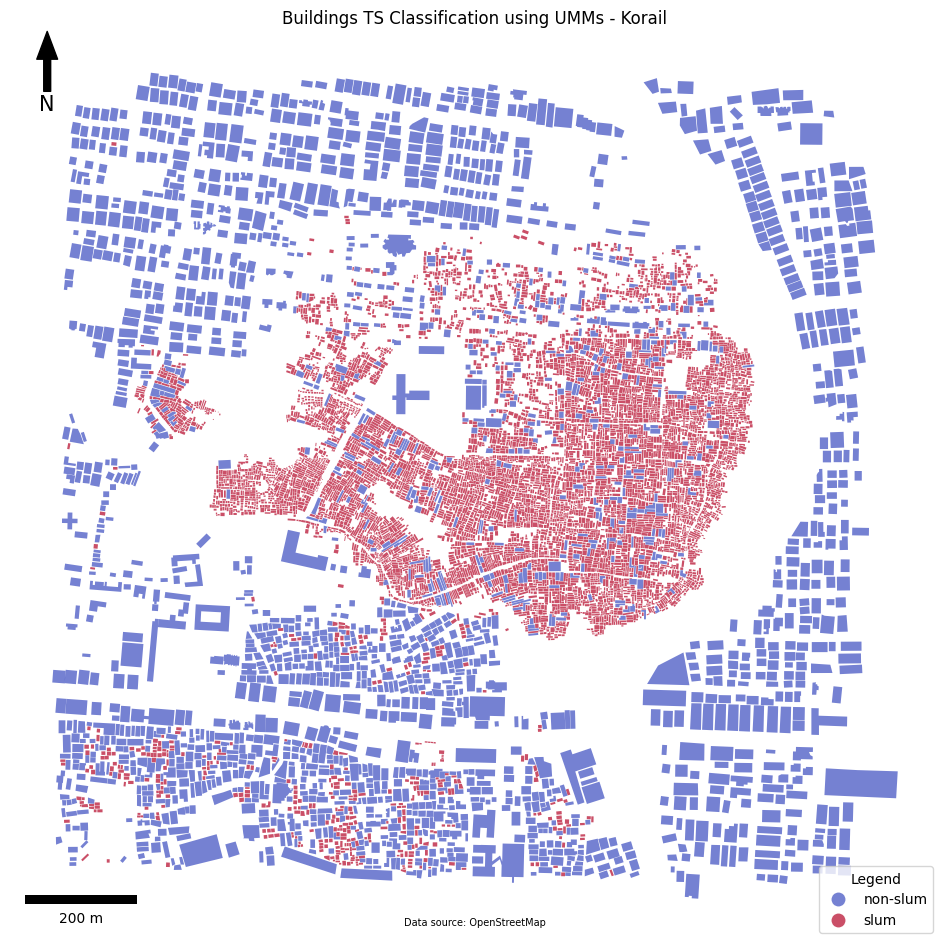

In [ ]:

# Plot the classified buildings
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
joined_gdf.plot(column='label', cmap='coolwarm', alpha=.7, legend=True, ax=ax,
                legend_kwds={'loc': 'lower right', 'title': "Legend"})

# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

plt.title('Buildings TS Classification using UMMs - Korail')
ax.set_axis_off()
plt.show()

# Validation


In [ ]:
# Merge datasets on unique identifier
merged_df = pd.merge(joined_gdf[['uID', 'label']], buildings[['uID', 'label']], on='uID', suffixes=('_pred', '_true'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Number of correct predictions
correct_predictions = (merged_df['label_pred'] == merged_df['label_true']).sum()

# Total number of predictions
total_predictions = len(merged_df)

# Overall accuracy
o_accuracy = correct_predictions / total_predictions

print(f"Overall Accuracy: {o_accuracy * 100:.2f}%")

Overall Accuracy: 80.81%


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


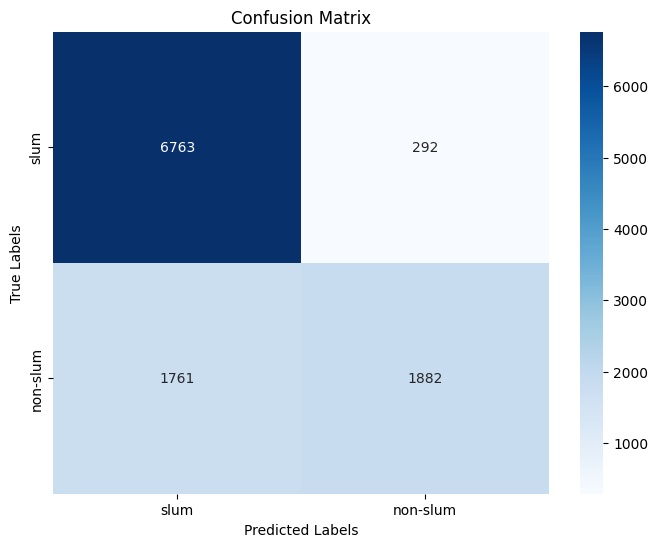

In [ ]:
# Confusion matrix
conf_matrix = confusion_matrix(merged_df['label_true'], merged_df['label_pred'], labels=['slum', 'non-slum'])

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['slum', 'non-slum'], yticklabels=['slum', 'non-slum'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
from sklearn.metrics import classification_report

# Classification report
class_report = classification_report(merged_df['label_true'], merged_df['label_pred'], target_names=['slum', 'non-slum'])

print("Classification Report:\n")
print(class_report)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Classification Report:

              precision    recall  f1-score   support

        slum       0.87      0.52      0.65      3643
    non-slum       0.79      0.96      0.87      7055

    accuracy                           0.81     10698
   macro avg       0.83      0.74      0.76     10698
weighted avg       0.82      0.81      0.79     10698



In [ ]:
from sklearn.metrics import silhouette_score
# Define initial search parameters
initial_range = {
    'area': (9.83471667e-01, 6.20814099e+01),
    'perimeter': (4.00416598, 503.73307637),
    # 'lal': (1.42894977, 136.21215332),
    # 'neighbour_dist': (0.15178101, 84.89425975),
    'mean_interbuilding_distance': (0.77341418, 46.32638561),
    # 'circular_com': (0.0710546, 0.6725763),
    # 'elongation': (0.05647717, 0.98963799),
    # 'fractal': (-0.12491594, 1.5265164),
    # 'cwa': (0.34050937, 183.06006313),
    # 'CAR': (0.00198657, 0.85265845),
    'tes_area': (3.45427300e+00, 3.69332982e+04),
    'avg_weighted_distance': (2.89401797, 46.34759165)
}
deviation_threshold = 0.6  # Desired deviation
num_parts = 10  # Number of parts to divide the range into

# Find the best threshold within a given range
def find_best_threshold_stepwise(data, metric, search_range, num_parts):
    best_threshold = None
    best_score = -np.inf

    step_size = (search_range[1] - search_range[0]) / num_parts
    thresholds = np.arange(search_range[0], search_range[1], step_size)

    for threshold in thresholds:
        data['predicted_label'] = np.where(data[metric] < threshold, 'slum', 'non-slum')

        # Check if we have at least two distinct clusters
        if len(data['predicted_label'].unique()) < 2:
            continue

        try:
            score = silhouette_score(data[[metric]], data['predicted_label'])
        except ValueError as e:
            print(f"Skipping threshold {threshold} for {metric} due to error: {e}")
            continue

        if score > best_score:
            best_score = score
            best_threshold = threshold

    return best_threshold, best_score

# Stepwise search function
def stepwise_search(data, metric, initial_range, num_parts, deviation_threshold):
    current_range = initial_range
    best_threshold, best_score = find_best_threshold_stepwise(data, metric, current_range, num_parts)

    while (current_range[1] - current_range[0]) > deviation_threshold:
        step_size = (current_range[1] - current_range[0]) / num_parts
        current_range = (max(best_threshold - step_size, initial_range[0]), min(best_threshold + step_size, initial_range[1]))
        best_threshold, best_score = find_best_threshold_stepwise(data, metric, current_range, num_parts)

    return best_threshold, best_score

# Find best thresholds for each metric
best_thresholds = {}
for metric in initial_range:
    best_threshold, best_score = stepwise_search(joined_gdf, metric, initial_range[metric], num_parts, deviation_threshold)
    best_thresholds[metric] = best_threshold
    print(f"Best {metric} Threshold:", best_threshold, "with Score:", best_score)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Best area Threshold: 61.93477484824078 with Score: 0.7139711156163842
Best perimeter Threshold: 352.74298446912377 with Score: 0.958434769192016
Best mean_interbuilding_distance Threshold: 44.35849724422399 with Score: 0.8679506793566037
Best tes_area Threshold: 20354.12633413816 with Score: 0.9891759748288329
Best avg_weighted_distance Threshold: 46.27806593211198 with Score: 0.8571934545919531


In [ ]:
# Apply best thresholds to classify buildings
joined_gdf['label2'] = np.where(
    (joined_gdf['area'] < best_thresholds['area']) &
    (joined_gdf['perimeter'] < best_thresholds['perimeter']) &
    # (joined_gdf['lal'] < best_thresholds['lal']) &
    # (joined_gdf['neighbour_dist'] < best_thresholds['neighbour_dist']) &
    (joined_gdf['mean_interbuilding_distance'] < best_thresholds['mean_interbuilding_distance']) &
    # (joined_gdf['circular_com'] < best_thresholds['circular_com']) &
    # (joined_gdf['elongation'] < best_thresholds['elongation']) &
    # (joined_gdf['fractal'] < best_thresholds['fractal']) &
    # (joined_gdf['cwa'] < best_thresholds['cwa']) &
    # (joined_gdf['CAR'] < best_thresholds['CAR']) &
    (joined_gdf['tes_area'] < best_thresholds['tes_area'])&
    (joined_gdf['avg_weighted_distance'] < best_thresholds['avg_weighted_distance']),
    'slum', 'non-slum'
)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


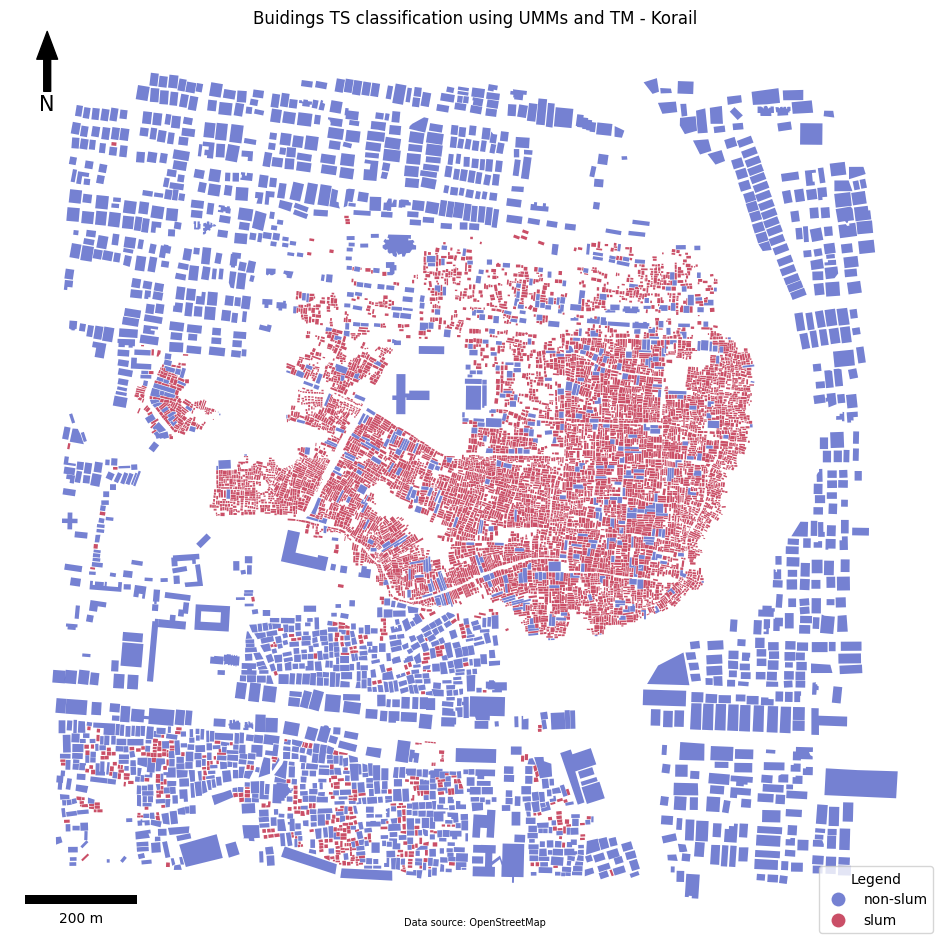

In [ ]:


# Plot the classified buildings
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
joined_gdf.plot(column='label2', cmap='coolwarm', alpha=.7, legend=True, ax=ax,
                legend_kwds={'loc': 'lower right', 'title': "Legend"})

# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

plt.title('Buidings TS classification using UMMs and TM - Korail')
ax.set_axis_off()
plt.show()

In [ ]:
# Merge datasets on unique identifier
merged_df2 = pd.merge(joined_gdf[['uID', 'label2']], buildings[['uID', 'label']], on='uID', suffixes=('_pred', '_true'))
print(merged_df2.columns)

Index(['uID', 'label2', 'label'], dtype='object')


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Number of correct predictions
correct_predictions = (merged_df2['label2'] == merged_df2['label']).sum()

# Total number of predictions
total_predictions = len(merged_df2)

# Overall accuracy
o_accuracy = correct_predictions / total_predictions

print(f"Overall Accuracy: {o_accuracy * 100:.2f}%")

Overall Accuracy: 80.82%


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
